# [IAPR][iapr]: Coin Detection Project


**Group ID:** 50

**Author 1 (sciper):** Hana Catic (370754)  
**Author 2 (sciper):** Jad Bhamdouni (370746)   

[iapr]: https://github.com/LTS5/iapr/

- pipe line explanation

In [1]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import utils
from collections import Counter

import skimage
from skimage import io
from PIL import Image
from typing import Callable
from skimage.color import rgb2hsv

import warnings
warnings.filterwarnings("ignore")

c:\Users\HanaCatic\anaconda3\envs\iapr\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


### Dataset Class

For easier manipulation of the dataset, first we define `CoinDataset` class based on Pytorch tutorials (https://pytorch.org/tutorials/beginner/basics/data_tutorial.html). The images in the dataset have a very high resolution, thus the computation time is very high. In order to decrease the computation time all of the images in the dataset are downsampled by 50%. All of the segmentation tuning in following steps is conducted on the downsampled dataset.

The folder structure is as follows:

```code
├── Project_Group50.ipynb
└── dataset
    └── train
        └── all of the individual images from all of the subsets
```

In [2]:
class CoinDataset(Dataset):
    """A custom Dataset class for the Coin Dataset.

        Attributes:
        
        labels: labels of each of the images in the directory
        root: path to the directory containing images
        
    """
    def __init__(self):
        """
        Class constructor, initialise the directory containing images, based on the given folder structure.
        """
        self.labels = pd.read_csv("dataset/train_labels.csv")
        self.root = "dataset/train/"

        
    def __len__(self):
        """
        Returns number of samples in the dataset.
        """
        return len(self.labels)
    
    def __getitem__(self, index):
        """
        Loads and returns a sample from the dataset at a given index.
         
        Args
        ----
        index: integer
            Index of the sample.
    
        Return
        ------
        sample: dict
            Sample at the given index.
        ----
        """
        if torch.is_tensor(index):
            index = index.tolist()
    
        img_name = os.path.join(self.root, self.labels.iloc[index, 0]+ ".JPG") # identification of image's location on disk
        image = io.imread(img_name)
        coins = torch.tensor(self.labels.iloc[index, 1:]) # retrieve corresponding label
        
        sample = {'image': image, 'coins': coins}
        
        sample = self.transform(sample) # Apply transformation
        
        return sample
    
    def transform(self, sample):
        
        """
        Downsamples the image.
                 
        Args
        ----
        sample: dict
            Sample from the dataset.    
        Return
        ------
        transformed_sample: dict
            Downsampled sample.
        ----
        """
        
        image_og = sample['image'] 
        
        # Down scaling image by 50%

        scale_percent = 50
        width = int(image_og.shape[1] * scale_percent / 100)
        height = int(image_og.shape[0] * scale_percent / 100)
        dim = (width, height)
        image_red = cv2.resize(image_og, dim, interpolation=cv2.INTER_AREA)
        
        transformed_sample = {'image':image_red, 'coins': sample['coins']}
        
        return transformed_sample
    

In [3]:
coin_dataset = CoinDataset() # initialise an instance of the CoinDataset

## Image segmentation

### Thresholding
In this section different colour models are investigated to determine the colour models with best separation of coin against the background. We note here that while at first a single approach to apply to all of the different types of images was attempted, however, it was observed that the background type significantly influences separability of the images across different colour models. Thus we developed different approaches combining different colour models to treat different cases and coins based on the background type, this will be discussed in more detail in the later sections. Three colour models are considered, RGB, HSV and LAB. For each of the background types one typical image is chosen for further analysis, whether there are OODs in the images does not matter in this stage, then for each of the colour models the channels are extracted and histograms are considered to determine separability.

In [4]:
img_neutral = coin_dataset[0]['image']
img_noisy = coin_dataset[20]['image']
img_hand = coin_dataset[37]['image']

### RGB 

The most common model is the RGB colour model. In this case it seems obvious that this colour model could at least be used for segmentation of coins on the noisy background. As noted in the introduction to the thresholding section, we first extract the channels and examine the colour histograms. 

_The code for extraction is taken from the first lab session, and code for ploting the colour histograms is taken from the functions provided along the lab sessions._

In [5]:
# Plot color space distribution 
def plot_colors_histo(
    img: np.ndarray,
    func: Callable,
    labels: list[str],
):
    """
    Plot the original image (top) as well as the channel's color distributions (bottom).

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    func: Callable
        A callable function that extracts D channels from the input image
    labels: list of str
        List of D labels indicating the name of the channel
    """

    # Extract colors
    channels = func(img=img)
    C2 = len(channels)
    M, N, C1 = img.shape
    fig = plt.figure(figsize=(16, 10))
    gs = fig.add_gridspec(3, C2)

    # Use random seed to downsample image colors (increase run speed - 10%)
    mask = np.random.RandomState(seed=0).rand(M, N) < 0.1
    
    # Plot base image
    ax = fig.add_subplot(gs[:2, :])
    ax.imshow(img)
    # Remove axis
    ax.axis('off')
    ax1 = fig.add_subplot(gs[2, 0])
    ax2 = fig.add_subplot(gs[2, 1])
    ax3 = fig.add_subplot(gs[2, 2])

    # Plot channel distributions
    ax1.scatter(channels[0][mask].flatten(), channels[1][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax1.set_xlabel(labels[0])
    ax1.set_ylabel(labels[1])
    ax1.set_title("{} vs {}".format(labels[0], labels[1]))
    ax2.scatter(channels[0][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax2.set_xlabel(labels[0])
    ax2.set_ylabel(labels[2])
    ax2.set_title("{} vs {}".format(labels[0], labels[2]))
    ax3.scatter(channels[1][mask].flatten(), channels[2][mask].flatten(), c=img[mask]/255, s=1, alpha=0.1)
    ax3.set_xlabel(labels[1])
    ax3.set_ylabel(labels[2])
    ax3.set_title("{} vs {}".format(labels[1], labels[2]))
        
    plt.tight_layout()
    # Plot color space distribution 

def plot_thresholded_image(
    img: np.ndarray,
    func: Callable,
    title: str,
):
    """
    Plot the original image and its thresholded version

    Args
    ----
    img: np.ndarray (M, N, 3)
        Input image of shape MxNx3.
    func: Callable
        Thresholded image.
    title: str
        Title of the plot
    """
    plt.figure()
    fig, axes = plt.subplots(1, 2, figsize=(10, 4))
    axes[0].imshow(img)
    axes[1].imshow(func(img))
    [a.axis('off') for a in axes]
    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


In [6]:
def extract_rgb_channels(img):
    """
    Extract RGB channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_red: np.ndarray (M, N)
        Red channel of input image
    data_green: np.ndarray (M, N)
        Green channel of input image
    data_blue: np.ndarray (M, N)
        Blue channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for RGB channels
    data_red = np.zeros((M, N))
    data_green = np.zeros((M, N))
    data_blue = np.zeros((M, N))

    # ------------------
    data_red = img[:,:,0]
    data_green = img[:,:,1]
    data_blue = img[:,:,2]
    # ------------------
    
    return data_red, data_green, data_blue

##### Neutral background

First we consider RGB colour space on images with neutral background. 

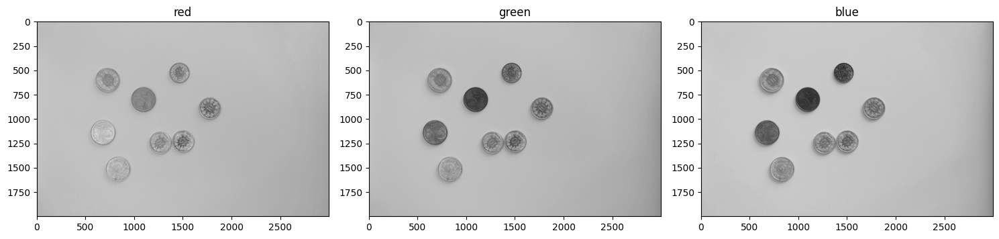

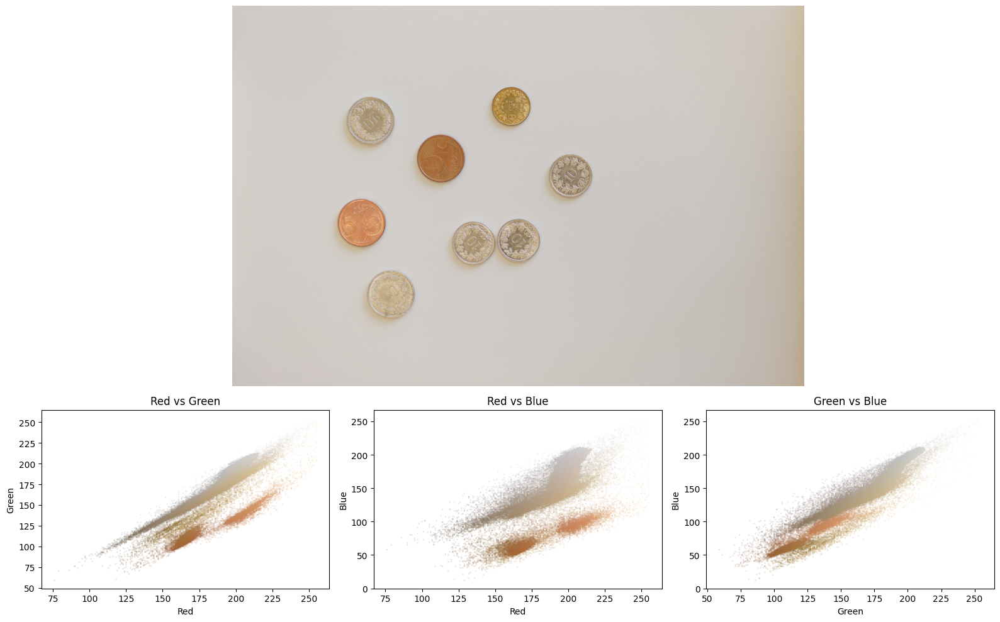

In [7]:
[data_red,data_green,data_blue] = extract_rgb_channels(img_neutral)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('red')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('green')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('blue')

plt.tight_layout()

# Call plotting function with your implemented function
plot_colors_histo(
    img = img_neutral,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

##### Noisy background

Then we consider RGB colour space on images with noisy background. 

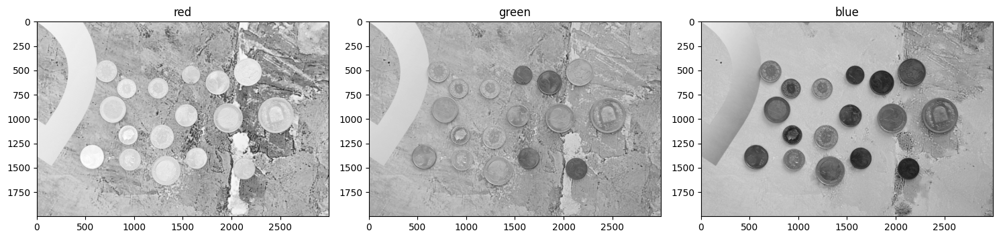

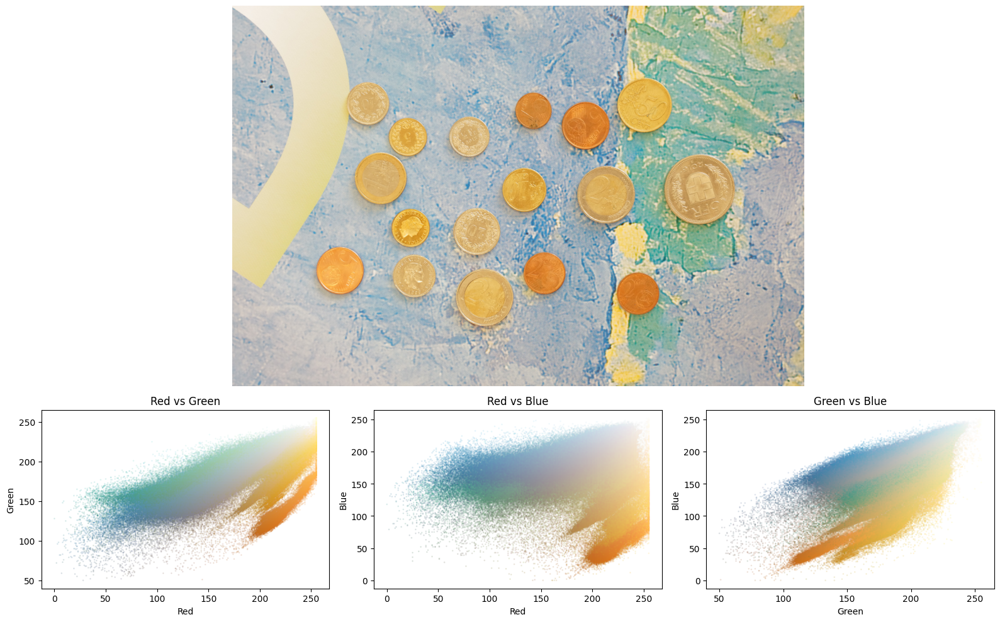

In [8]:
[data_red,data_green,data_blue] = extract_rgb_channels(img_noisy) 

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('red')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('green')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('blue')

plt.tight_layout()

plot_colors_histo(
    img = img_noisy,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

##### Hand background

Lastly, we consider RGB colour space on images with hand background. 

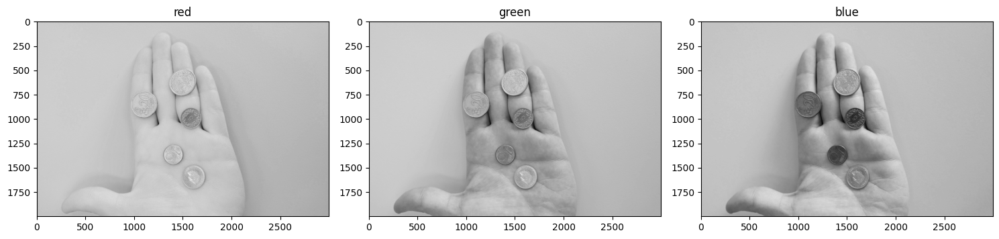

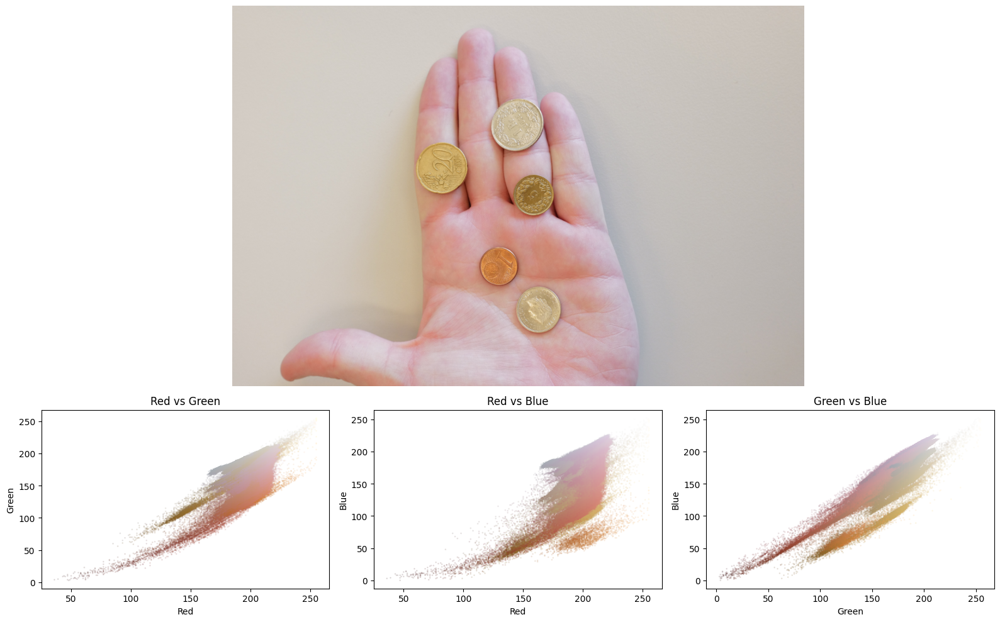

In [9]:
[data_red,data_green,data_blue] = extract_rgb_channels(img_hand) 

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('red')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('green')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('blue')

plt.tight_layout()

plot_colors_histo(
    img = img_hand,
    func = extract_rgb_channels,
    labels = ["Red", "Green", "Blue"],
)

Based on the histogram figures given above for the three representative images, it can be observed that while a line that separates the colours for all of the cases can be determined, it can not be described by a simple threshold. Due to this RGB colour space was not used for thresholding. Additionally, for all of the cases of background there are some coins that have colour space very close to the background. However, we can expect this to be an issue for all of the considered colour spaces.

### HSV

Next we consider the HSV colour model. We apply apply the same approach, first extracting the channels and then examining the colour histograms. 

_The code for extraction is taken from the first lab session_

In [10]:
def extract_hsv_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # Define default values for HSV channels
    data_h = np.zeros((M, N))
    data_s = np.zeros((M, N))
    data_v = np.zeros((M, N))

    # ------------------
    hsv_img = rgb2hsv(img)
    data_h = hsv_img[:,:,0]
    data_s = hsv_img[:,:,1]
    data_v = hsv_img[:,:,2]
    # ------------------
    
    return data_h, data_s, data_v

##### Neutral background

First we consider HSV colour space on images with neutral background. 

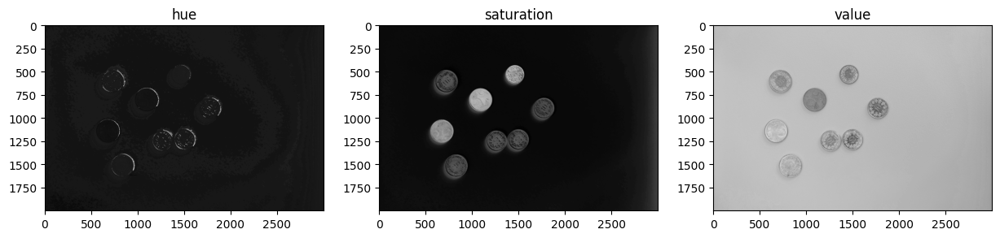

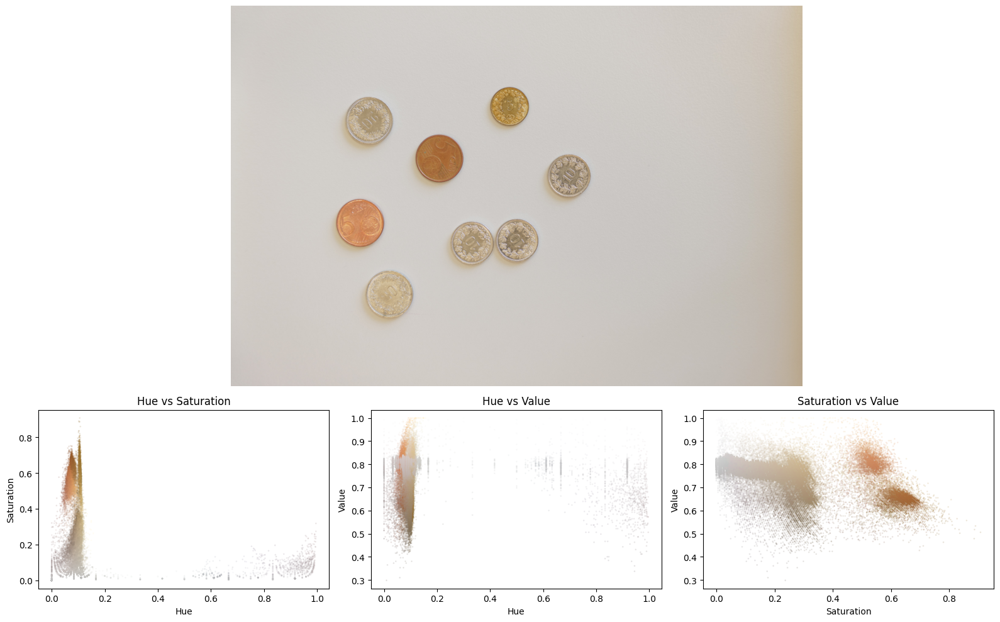

In [11]:
[data_h,data_s,data_v] = extract_hsv_channels(img_neutral)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_h, cmap='gray')
plt.title('hue')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_s, cmap='gray')
plt.title('saturation')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_v, cmap='gray')
plt.title('value')

plot_colors_histo(
    img = img_neutral,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)


It can be observed in the figure given above, that saturation level around 0.4 givies a good separation of rose gold and gold coins from the neutral background and a little less successful separation of silver coins with threshold around 0.2. Based on this, it seems possible to use this colour space for segmentation of coins on neutral background.  

##### Noisy background

Then we consider HSV colour space on images with noisy background. 

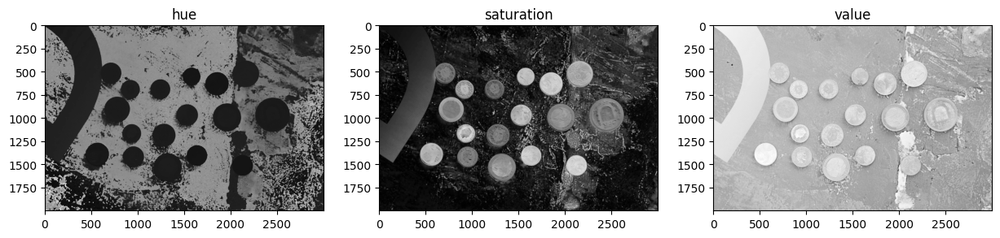

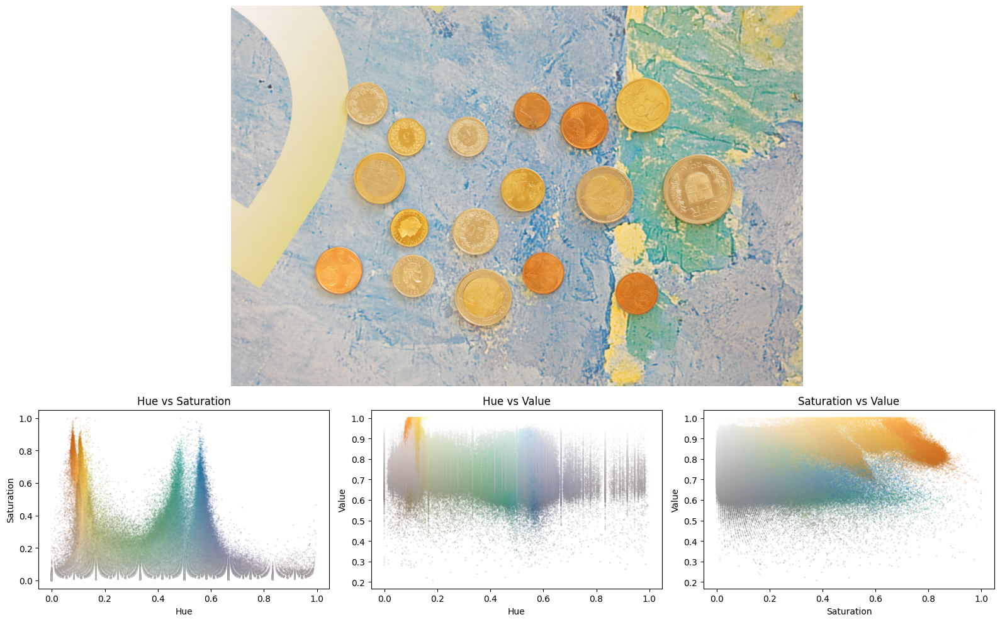

In [12]:
[data_h,data_s,data_v] = extract_hsv_channels(img_noisy)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_h, cmap='gray')
plt.title('hue')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_s, cmap='gray')
plt.title('saturation')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_v, cmap='gray')
plt.title('value')

plot_colors_histo(
    img = img_noisy,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)

It can be observed that for noisy background saturation channel is not a good choice, as on this channel when look at the Saturation vs Value plot, the space is not separable with a simple threshold. Conversly, threshold around 0.2 could with some success separate the coins. There two main issues when it comes to the noisy background. Firstly, the gold in the background which could lead to false detections or hiding coins. Secondly, as seen on the Hue vs Value plot the blue hue of the background is similar to the hues in the coins and could clutter the resulting binary image. Finally, it might be possible to use this colour space in combination with others.

##### Hand background

Lastly, we consider HSV colour space on images with hand background. 

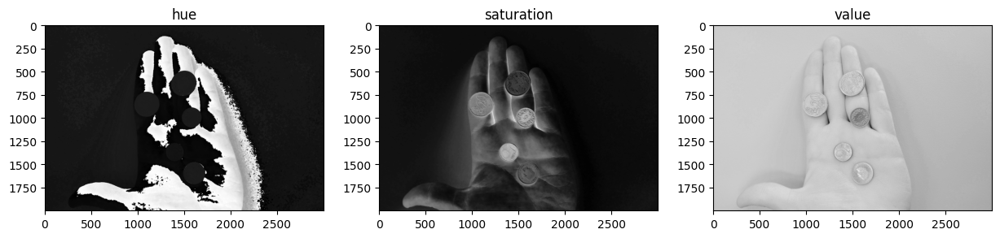

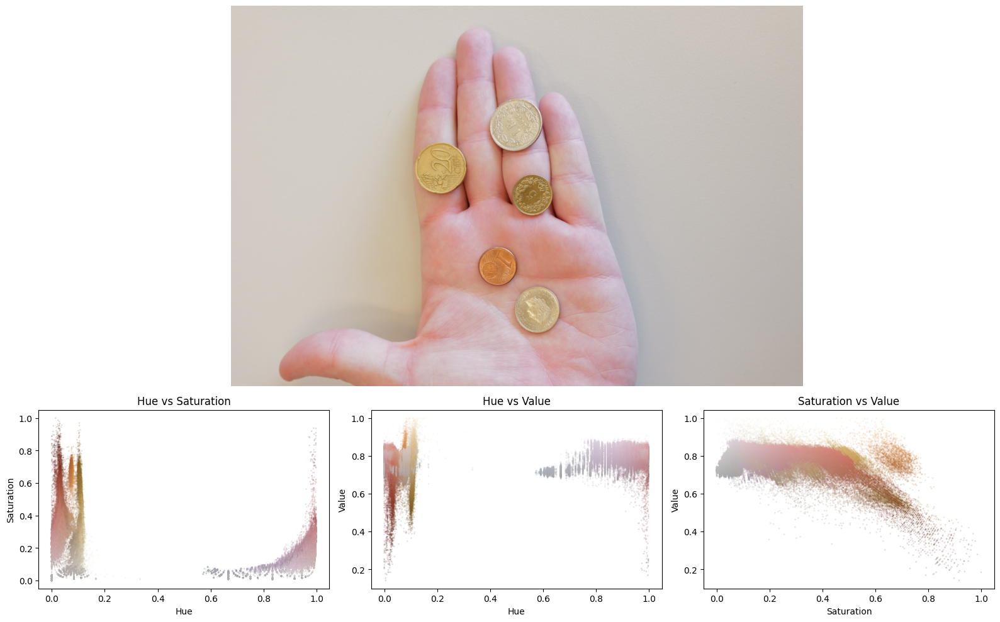

In [13]:
[data_h,data_s,data_v] = extract_hsv_channels(img_hand)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_h, cmap='gray')
plt.title('hue')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_s, cmap='gray')
plt.title('saturation')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_v, cmap='gray')
plt.title('value')

plot_colors_histo(
    img = img_hand,
    func = extract_hsv_channels,
    labels = ["Hue", "Saturation", "Value"],
)

Unlike the RGB for all of the background types and HSV for the other types, when applied to the hand background, there is a very clear separation of the colours on the hue channel. However, when taking a closer look at the channel figure, it is observed that a significant number of pixels that correspond to the hand have the same hue as the coins. For this reason, instead we consider the saturation channel, in the channel figure we observe that while there might not be a good separation for all coins, the rose gold coins are separated very well in the hue channel. Value channel does not seem to give information that could be used for separation. For these reasons we conclude that only the saturation channel could be used in this case. 

Just by considering these two colour spaces it is observed that the background has a significant influence on which channel in the colour space could be used for separation. Not only does a good threshold depend on the background type but also the coins themselves, as some coins are more separable in some colour spaces and channels and less separable in others.

In [25]:
def extract_LAB_channels(img):
    """
    Extract HSV channels from the input image.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    data_h: np.ndarray (M, N)
        Hue channel of input image
    data_s: np.ndarray (M, N)
        Saturation channel of input image
    data_v: np.ndarray (M, N)
        Value channel of input image
    """

    # Get the shape of the input image
    M, N, C = np.shape(img)

    # ------------------
    LAB_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    L = LAB_img[:,:,0]
    A = LAB_img[:,:,1]
    B = LAB_img[:,:,2]
    # ------------------
    
    return L, A, B

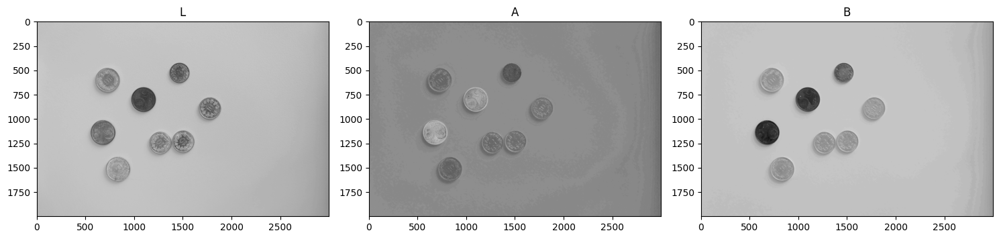

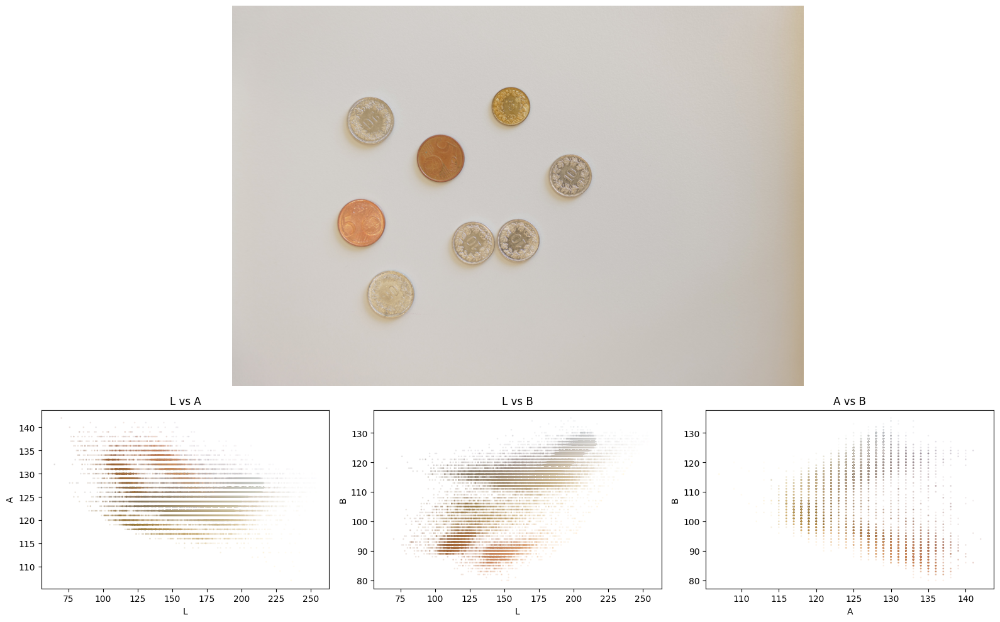

In [26]:
[data_red,data_green,data_blue] = extract_LAB_channels(img_neutral)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('L')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('A')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('B')

plt.tight_layout()

plot_colors_histo(
    img = img_neutral,
    func = extract_LAB_channels,
    labels = ["L", "A", "B"],
)

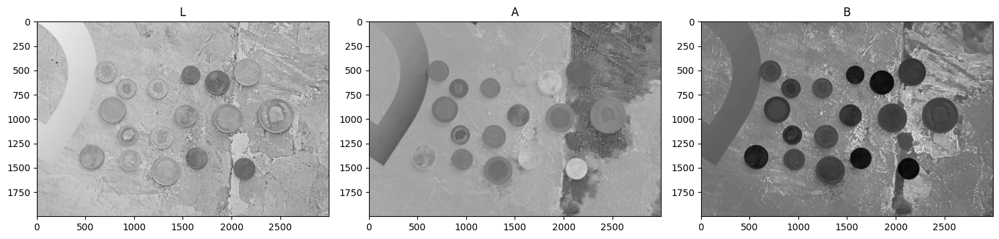

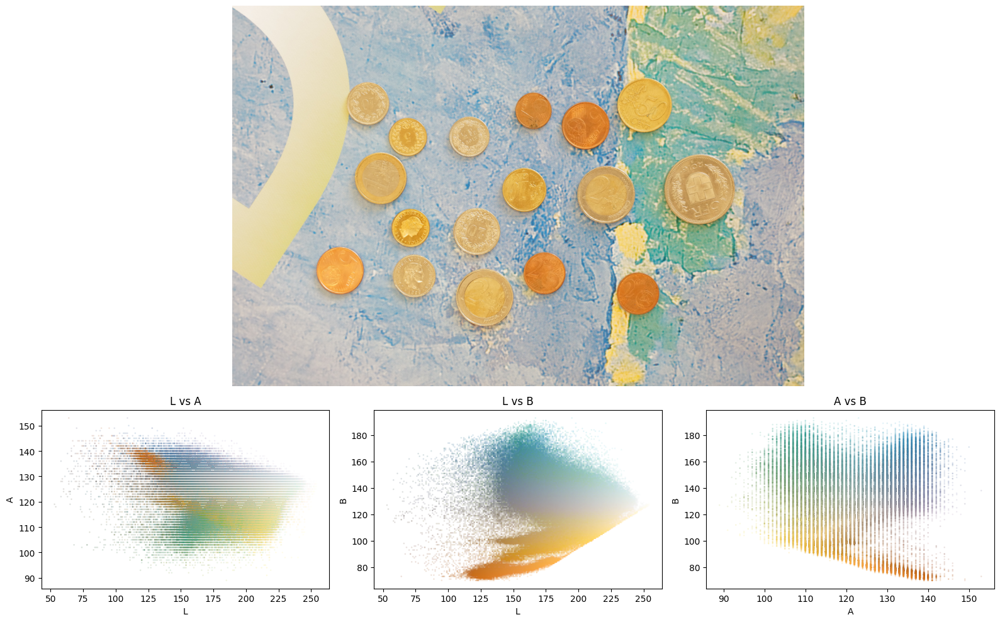

In [27]:
[data_red,data_green,data_blue] = extract_LAB_channels(img_noisy)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('L')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('A')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('B')

plt.tight_layout()

plot_colors_histo(
    img = img_noisy,
    func = extract_LAB_channels,
    labels = ["L", "A", "B"],
)

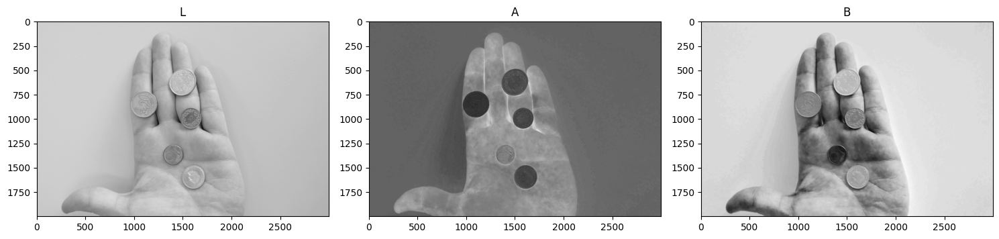

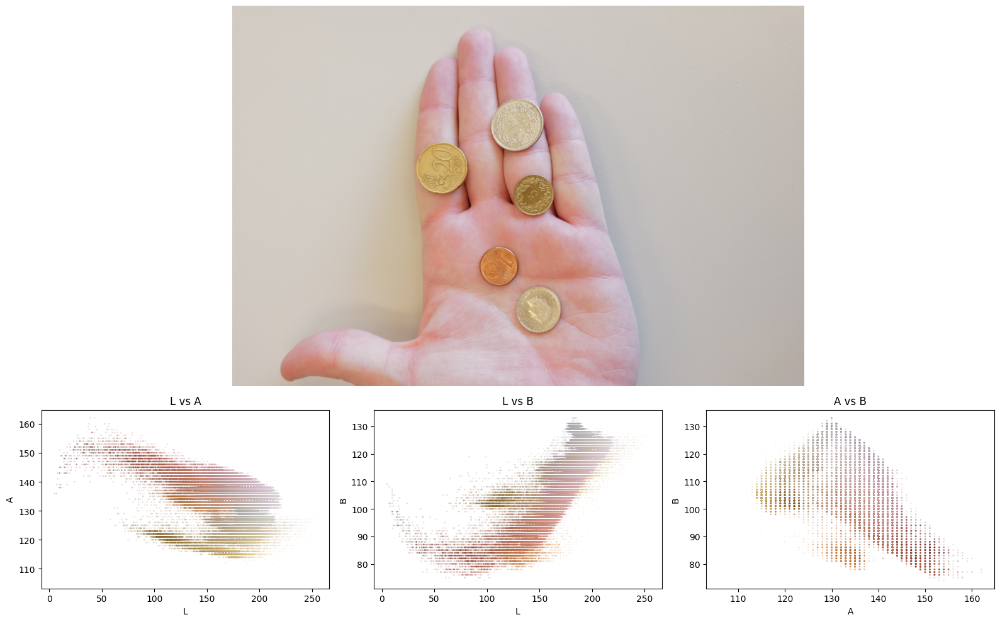

In [28]:
[data_red,data_green,data_blue] = extract_LAB_channels(img_hand)

# Create subplots
plt.figure(figsize=(15, 5))

# Plot the first image
plt.subplot(1, 3, 1)  # 1 row, 3 columns, plot 1
plt.imshow(data_red, cmap='gray')
plt.title('L')

# Plot the second image
plt.subplot(1, 3, 2)  # 1 row, 3 columns, plot 2
plt.imshow(data_green, cmap='gray')
plt.title('A')

# Plot the third image
plt.subplot(1, 3, 3)  # 1 row, 3 columns, plot 3
plt.imshow(data_blue, cmap='gray')
plt.title('B')

plt.tight_layout()

plot_colors_histo(
    img = img_hand,
    func = extract_LAB_channels,
    labels = ["L", "A", "B"],
)

<Figure size 640x480 with 0 Axes>

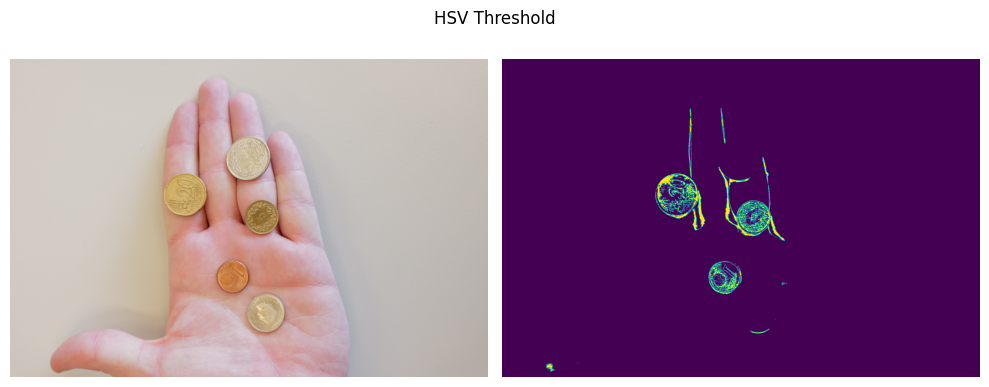

In [14]:
def apply_hsv_threshold(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))

    # Use the previous function to extract HSV channels
    data_h, data_s, data_v = extract_hsv_channels(img=img)
    
    # ------------------
    
    thr_s_low = 0.51
    thr_s_up = 0.65 #   Threshold on saturation
    mask_s_low = data_s > thr_s_low   
    mask_s_up = data_s < thr_s_up#   Mask computed on saturation
    img_th = (mask_s_low*mask_s_up)
    
    # ------------------

    return img_th

plot_thresholded_image(img=img_hand, func=apply_hsv_threshold, title="HSV Threshold")

In [30]:
def apply_LAB_threshold_hand(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))        
    # ------------------

    LAB_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    thr_A = 130      #   Threshold on A channel
    mask_A = LAB_img[:,:,1] > thr_A     #   Mask computed on A channel
    img_th = np.logical_not(mask_A) 
    
    # ------------------
    return  img_th

def apply_LAB_threshold_noisy(img):
    """
    Apply threshold to the input image in hsv colorspace.

    Args
    ----
    img: np.ndarray (M, N, C)
        Input image of shape MxN and C channels.
    
    Return
    ------
    img_th: np.ndarray (M, N)
        Thresholded image.
    """

    # Define the default value for the input image
    M, N, C = np.shape(img)
    img_th = np.zeros((M, N))
        
    # ------------------

    LAB_img = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

    thr_B = 107     #   Threshold on B channel
    
    mask_B = LAB_img[:,:,2] > thr_B  
    mask_3 = LAB_img[:,:,2] > 114
    mask_4 = LAB_img[:,:,2] < 117

    img_th = np.logical_or(np.logical_not(mask_B), mask_3*mask_4) #+ np.logical_not(mask_3)
    # ------------------
    return img_th



<Figure size 640x480 with 0 Axes>

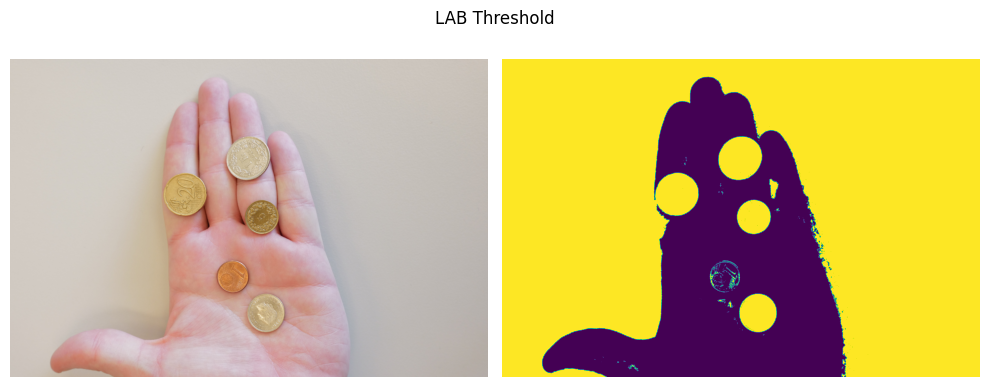

<Figure size 640x480 with 0 Axes>

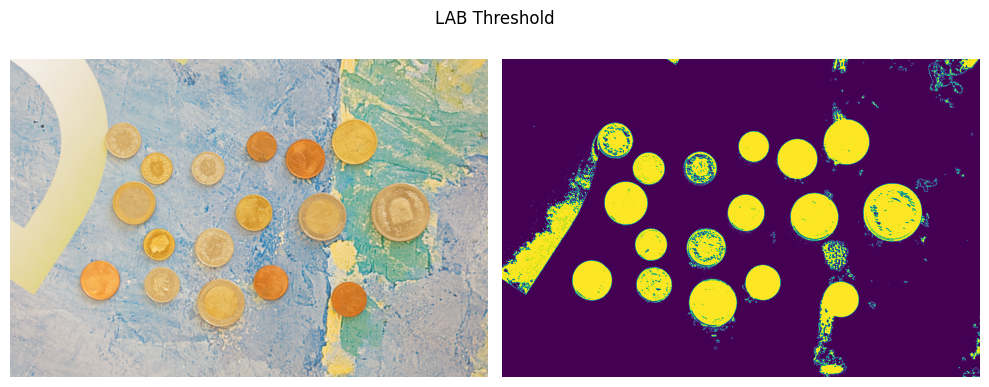

In [31]:
plot_thresholded_image(img=img_hand, func=apply_LAB_threshold_hand, title="LAB Threshold")
plot_thresholded_image(img=img_noisy, func=apply_LAB_threshold_noisy, title="LAB Threshold")

In [32]:
def apply_threshold(img):
    # https://stackoverflow.com/questions/70659992/how-to-improve-accuracy-of-cv2s-houghcircles
    image_blurred = cv2.medianBlur(img, 17)
    background = find_background(img)
    neutral_detected, coins = detect_neutral(img)
    hand_detected, hand = detect_hand(img)
    if neutral_detected and background[0] > 180:
        background_type = "neutral"
        img_th = np.logical_not(coins==0)
    elif hand_detected and background[0] > 180:
        background_type = "hand"
        img_th = np.logical_not(np.logical_or(apply_LAB_threshold_hand(img), apply_hsv_threshold(img))) 
    else:
        img_th = apply_LAB_threshold_noisy(image_blurred)
        background_type = "noisy"
    return img_th#, background_type

def detect_neutral(img):
    # https://stackoverflow.com/questions/58668245/how-to-quickly-and-efficiently-check-if-an-image-is-mostly-background
    h,w, _ = img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY_INV)[1]
    pixels = cv2.countNonZero(thresh)
    ratio = pixels/(h*w) * 100
    return ratio < 10, thresh

def detect_hand(img):
    h,w, _ = img.shape
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    thresh = cv2.threshold(gray, 0, 255, cv2.THRESH_OTSU+cv2.THRESH_BINARY_INV)[1]
    pixels = cv2.countNonZero(thresh)
    ratio = pixels/(h*w) * 100    
    return (ratio < 30), thresh

def find_background(img):
    # https://umarmasud07.medium.com/easiest-approach-for-background-colour-detection-5914217da325
    blue,green,red=cv2.split(img)
    blue=blue.flatten()
    green=green.flatten()
    red=red.flatten()
    blue_counter=Counter(blue)
    green_counter=Counter(green)
    red_counter=Counter(red)
    blue_most=blue_counter.most_common(10)
    blue_avg=[i for i,j in blue_most]
    blue_avg=int(np.mean(blue_avg))
 
    green_most=green_counter.most_common(10)
    green_avg=[i for i,j in green_most]
    green_avg=int(np.mean(green_avg))
    red_most=red_counter.most_common(10)
    red_avg=[i for i,j in red_most]
    red_avg=int(np.mean(red_avg))
    background=[blue_avg,green_avg,red_avg]
    return(background)


<Figure size 640x480 with 0 Axes>

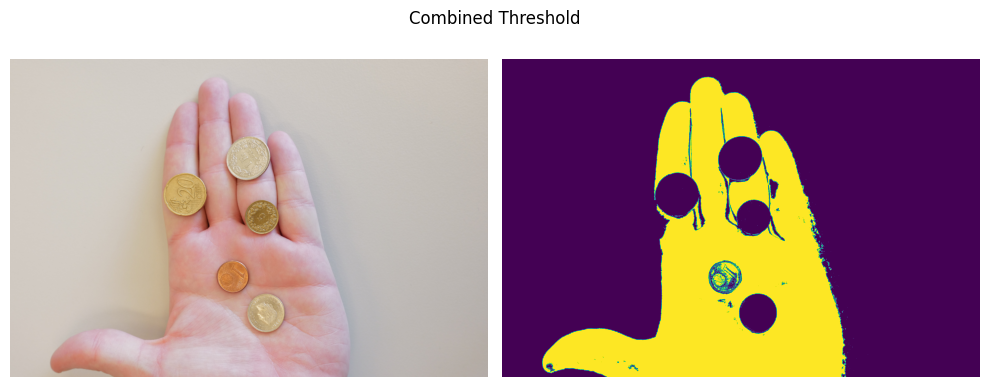

In [33]:
plot_thresholded_image(img=img_hand, func=apply_threshold, title="Combined Threshold")

In [ ]:
# import random
# list = random.sample(range(0,80),5)
# print(list)
# list = [3, 4, 56,31, 32, 66, 77]
# for i in list:
#     print(i, coin_dataset.labels.iloc[i, 0])
#     plot_thresholded_image(img=coin_dataset[i]['image'], func=apply_threshold, title="Combined Threshold")

In [ ]:
def apply_morphology(img_th):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_morph = np.zeros_like(img_th)
    
    # ------------------
    img_obj = skimage.morphology.remove_small_objects(img_th, min_size=100, connectivity=1, out=None)
    img_morph = skimage.morphology.remove_small_holes(img_obj, area_threshold=20, connectivity=1, out=None)
    # ------------------
    
    return img_morph

In [20]:
def apply_processing(img):
    """
    Apply morphology to thresholded image

    Args
    ----
    img_th: np.ndarray (M, N)
        Image mask of size MxN.

    Return
    ------
    img_morph: np.ndarray (M, N)
        Image after morphological operations
    """

    img_thr = np.zeros_like(img)
    
    # ------------------
    img_thr, background_type = apply_threshold(img)
    # ------------------
    
    return img_thr, background_type

In [21]:
# import random
# list = random.sample(range(0,80),5)
# print(list)
# # list = [66, 29]
# list = [25, 29, 31, 32, 38, 77, 78, 79]

# for i in list:
#     print(i, coin_dataset.labels.iloc[i, 0])
#     img_th = apply_threshold(img=coin_dataset[i]['image'])
#     plot_thresholded_image(img=img_th, func=apply_morphology, title="Combined Threshold")

In [22]:
# import random
# list = random.sample(range(0,80),5)
# print(list)

# for i in list:
#     print(i, coin_dataset.labels.iloc[i, 0])
#     plot_thresholded_image(img=coin_dataset[i]['image'], func=apply_detection, title="Combined Threshold")

In [23]:
def apply_hough_transform(img):
    
    blur = cv2.GaussianBlur(img, (35,35), cv2.BORDER_DEFAULT) # https://stackoverflow.com/questions/70659992/how-to-improve-accuracy-of-cv2s-houghcircles

    circles = cv2.HoughCircles(blur,cv2.HOUGH_GRADIENT_ALT,1.5,minDist=110, param1=220,param2=0.6, minRadius=75,maxRadius=500)
    print(circles)
    circles = circles[0]
    
    return circles

def get_circles(img):
    img_processed, background_type = apply_processing(img)
    img_processed= img_processed.astype(np.uint8)*255
    circles = apply_hough_transform(img_processed)
    circles = np.uint16(np.around(circles))
    result = []
    for i in range(0, len(circles)):
        add = True
        for j in range(0, len(result)):
            if circles[i][0] == result[j][0] and result[j][1] == circles[i][1]:
                add = False
                if circles[i][2] > result[j][2]:
                    result[j][2] = circles[i][2]
        if add:
            result.append(circles[i])
    return img_processed, result

def crop_image_into_patches(image, circles): #, background_type):
    patches = []
    for i in range(len(circles)):
        current_circle = circles[i]
        current_x = current_circle[0]
        current_y = current_circle[1]
        current_r = current_circle[2]

        # Calculate bounding box coordinates for cropping
        top_left_x = max(0, current_x - current_r)
        top_left_y = max(0, current_y - current_r)
        bottom_right_x = min(image.shape[1], current_x + current_r)
        bottom_right_y = min(image.shape[0], current_y + current_r)

        # Crop circular region
        cropped = image[top_left_y:bottom_right_y, top_left_x:bottom_right_x]
        # if not (np.sum(cropped) > 1500 and background_type == "hand"):
        patches.append(cropped)
            
    return patches

def plot_coins(
    img: np.ndarray,
    func: Callable,
    title: str,
):
    """
    Plot the original image and its thresholded version

    Args
    ----
    img: np.ndarray (M, N, 3)
        Input image of shape MxNx3.
    func: Callable
        Thresholded image.
    title: str
        Title of the plot
    """
    plt.figure()
    print(img.shape)
    processed, circles = func(img)
    fig, ax = plt.subplots()

    ax.imshow(img)

    print("circles: ", circles)

    for i in circles:
        # draw the outer circle
        plt.scatter(i[0],i[1])
        # draw the center of the circle
        circle_obj = plt.Circle((i[0], i[1]), radius=i[2] , fill=False, color='r')
        ax.add_patch(circle_obj)
    plt.tight_layout()
    plt.show()

    return circles
    
# plot_coins(img=image_og, func=get_circles, title="Combined Threshold")

[69, 10, 43, 77, 72, 65, 48, 29, 45, 79]
25 L1010345
(2000, 3000, 3)
[[[1488.        828.        126.444786]
  [1756.5       664.5       125.794106]
  [1509.        421.5       126.69493 ]]]
circles:  [array([1488,  828,  126], dtype=uint16), array([1756,  664,  126], dtype=uint16), array([1509,  422,  127], dtype=uint16)]


<Figure size 640x480 with 0 Axes>

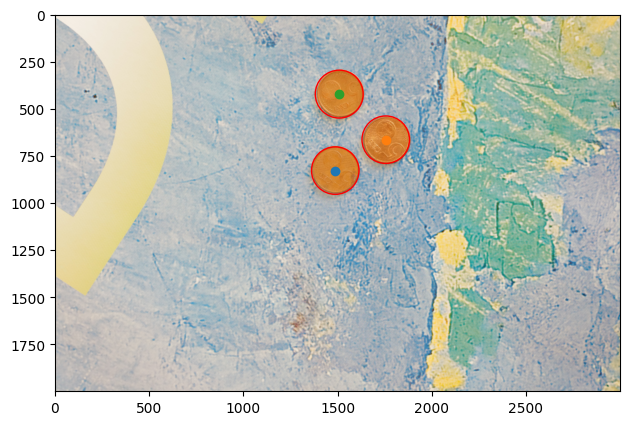

circles:  [array([1488,  828,  126], dtype=uint16), array([1756,  664,  126], dtype=uint16), array([1509,  422,  127], dtype=uint16)]
29 L1010369
(2000, 3000, 3)
[[[ 528.       1185.        180.32536 ]
  [ 433.5       574.5       149.38405 ]
  [1207.5      1201.5       141.44704 ]
  [ 895.5      1341.        129.33972 ]
  [1483.5       910.5       135.25133 ]
  [ 765.        646.5       121.35397 ]
  [ 831.        973.5       133.48311 ]
  [1065.        444.        114.39802 ]
  [1117.5       843.        104.114296]]]
circles:  [array([ 528, 1185,  180], dtype=uint16), array([434, 574, 149], dtype=uint16), array([1208, 1202,  141], dtype=uint16), array([ 896, 1341,  129], dtype=uint16), array([1484,  910,  135], dtype=uint16), array([765, 646, 121], dtype=uint16), array([831, 974, 133], dtype=uint16), array([1065,  444,  114], dtype=uint16), array([1118,  843,  104], dtype=uint16)]


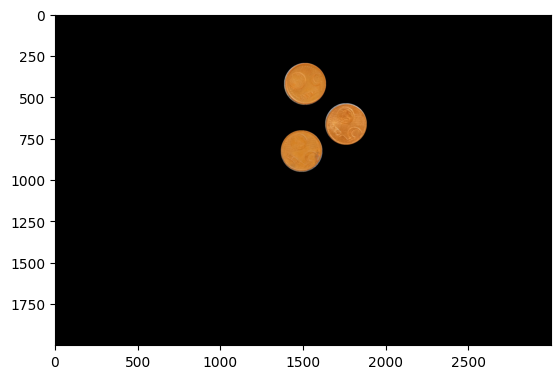

<Figure size 640x480 with 0 Axes>

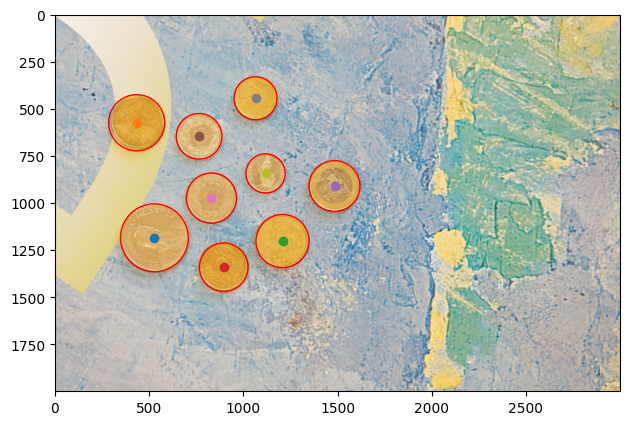

circles:  [array([ 528, 1185,  180], dtype=uint16), array([434, 574, 149], dtype=uint16), array([1208, 1202,  141], dtype=uint16), array([ 896, 1341,  129], dtype=uint16), array([1484,  910,  135], dtype=uint16), array([765, 646, 121], dtype=uint16), array([831, 974, 133], dtype=uint16), array([1065,  444,  114], dtype=uint16), array([1118,  843,  104], dtype=uint16)]
31 L1010395
(2000, 3000, 3)
[[[1581.       973.5      137.68695]
  [1980.      1560.        99.93504]
  [1752.      1339.5      150.77597]
  [1150.5      888.       112.42148]
  [ 964.5      619.5      107.42905]]]
circles:  [array([1581,  974,  138], dtype=uint16), array([1980, 1560,  100], dtype=uint16), array([1752, 1340,  151], dtype=uint16), array([1150,  888,  112], dtype=uint16), array([964, 620, 107], dtype=uint16)]


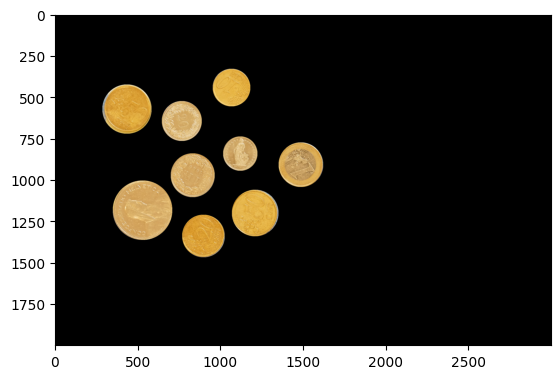

<Figure size 640x480 with 0 Axes>

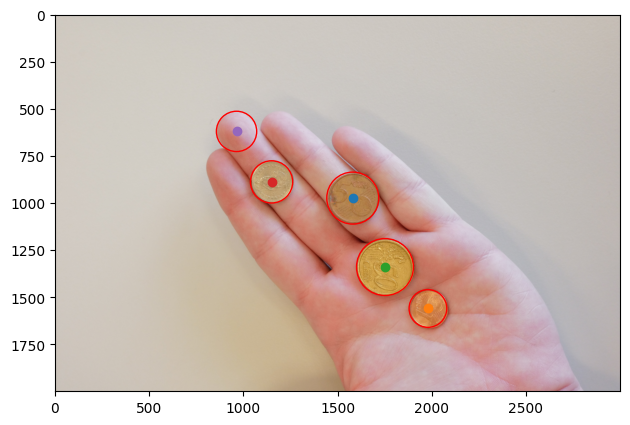

circles:  [array([1581,  974,  138], dtype=uint16), array([1980, 1560,  100], dtype=uint16), array([1752, 1340,  151], dtype=uint16), array([1150,  888,  112], dtype=uint16), array([964, 620, 107], dtype=uint16)]
32 L1010390
(2000, 3000, 3)
[[[1986.        982.5       132.63219 ]
  [1396.5       610.5       145.22014 ]
  [1576.5      1249.5       125.17624 ]
  [1951.5      1390.5       112.271454]
  [1290.        159.        105.92811 ]]]
circles:  [array([1986,  982,  133], dtype=uint16), array([1396,  610,  145], dtype=uint16), array([1576, 1250,  125], dtype=uint16), array([1952, 1390,  112], dtype=uint16), array([1290,  159,  106], dtype=uint16)]


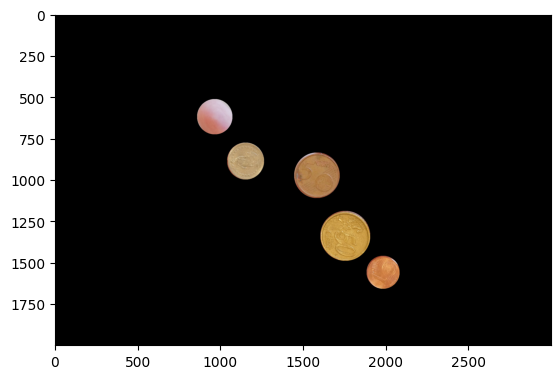

<Figure size 640x480 with 0 Axes>

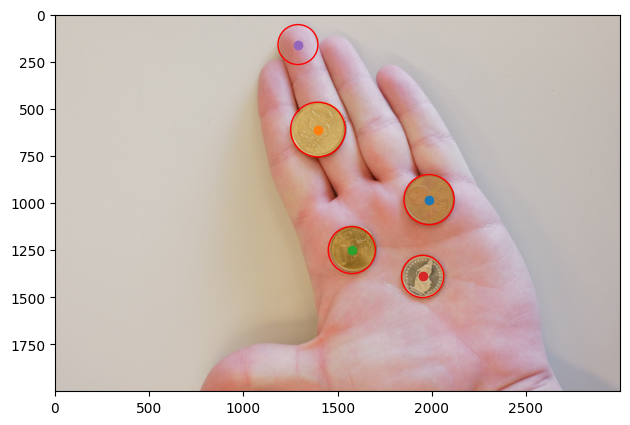

circles:  [array([1986,  982,  133], dtype=uint16), array([1396,  610,  145], dtype=uint16), array([1576, 1250,  125], dtype=uint16), array([1952, 1390,  112], dtype=uint16), array([1290,  159,  106], dtype=uint16)]
38 L1010388
(2000, 3000, 3)
[[[1485.       1279.5       197.39107 ]
  [1918.5      1107.        135.4093  ]
  [2070.       1492.5       124.167564]
  [1344.        634.5       182.79488 ]]]
circles:  [array([1485, 1280,  197], dtype=uint16), array([1918, 1107,  135], dtype=uint16), array([2070, 1492,  124], dtype=uint16), array([1344,  634,  183], dtype=uint16)]


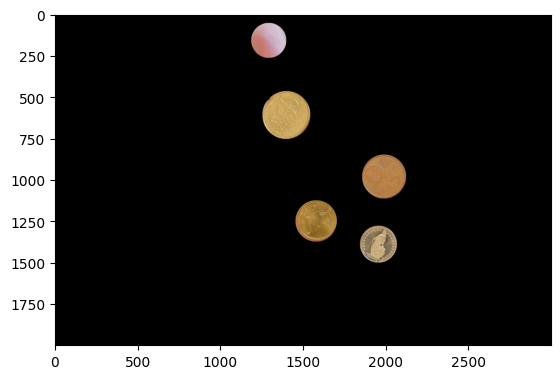

<Figure size 640x480 with 0 Axes>

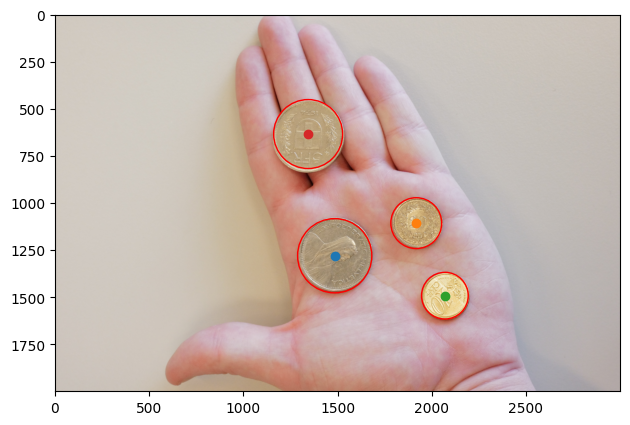

circles:  [array([1485, 1280,  197], dtype=uint16), array([1918, 1107,  135], dtype=uint16), array([2070, 1492,  124], dtype=uint16), array([1344,  634,  183], dtype=uint16)]
77 L1010506
(2000, 3000, 3)
[[[1447.5     1356.       200.07767]
  [1467.       978.       168.60237]
  [1168.5     1054.5      117.38407]]]
circles:  [array([1448, 1356,  200], dtype=uint16), array([1467,  978,  169], dtype=uint16), array([1168, 1054,  117], dtype=uint16)]


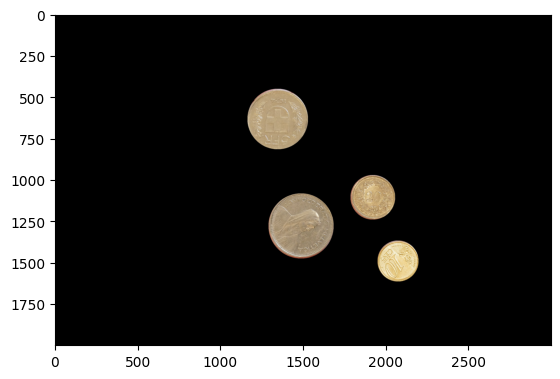

<Figure size 640x480 with 0 Axes>

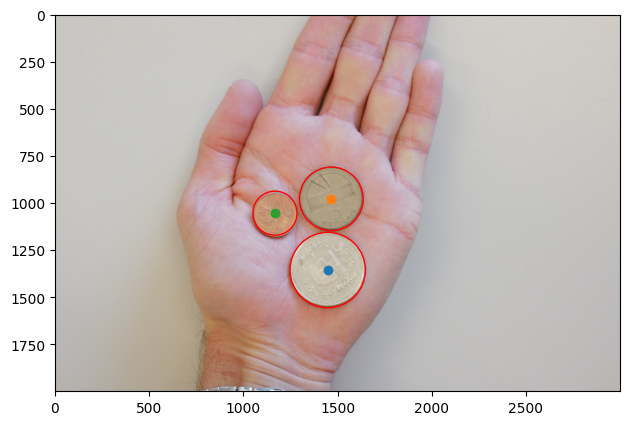

circles:  [array([1448, 1356,  200], dtype=uint16), array([1467,  978,  169], dtype=uint16), array([1168, 1054,  117], dtype=uint16)]
78 L1010521
(2000, 3000, 3)
[[[1750.5      625.5      194.10805]
  [1588.5     1170.       167.18362]
  [1353.       963.       152.05397]]]
circles:  [array([1750,  626,  194], dtype=uint16), array([1588, 1170,  167], dtype=uint16), array([1353,  963,  152], dtype=uint16)]


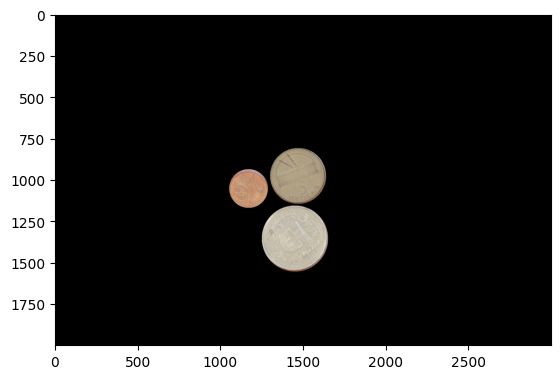

<Figure size 640x480 with 0 Axes>

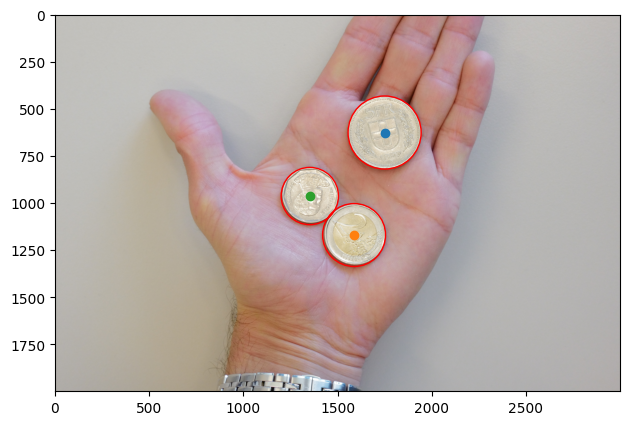

circles:  [array([1750,  626,  194], dtype=uint16), array([1588, 1170,  167], dtype=uint16), array([1353,  963,  152], dtype=uint16)]
79 L1010515
(2000, 3000, 3)
[[[1555.5     1060.5      164.69606]
  [1735.5      756.       156.72092]
  [1375.5      745.5      119.9861 ]
  [1122.       276.        91.88689]]]
circles:  [array([1556, 1060,  165], dtype=uint16), array([1736,  756,  157], dtype=uint16), array([1376,  746,  120], dtype=uint16), array([1122,  276,   92], dtype=uint16)]


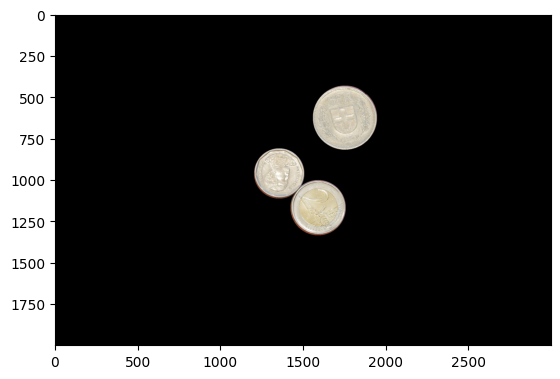

<Figure size 640x480 with 0 Axes>

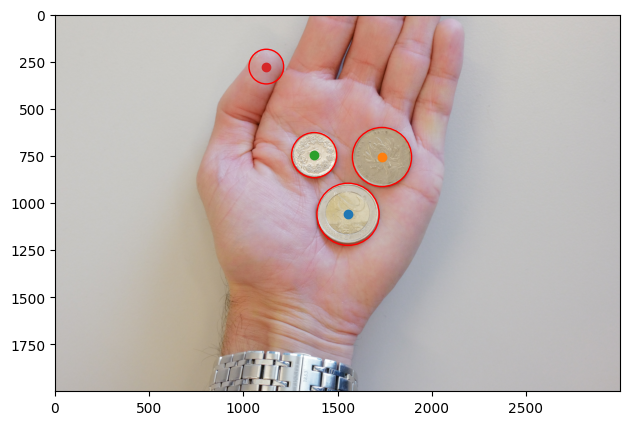

circles:  [array([1556, 1060,  165], dtype=uint16), array([1736,  756,  157], dtype=uint16), array([1376,  746,  120], dtype=uint16), array([1122,  276,   92], dtype=uint16)]


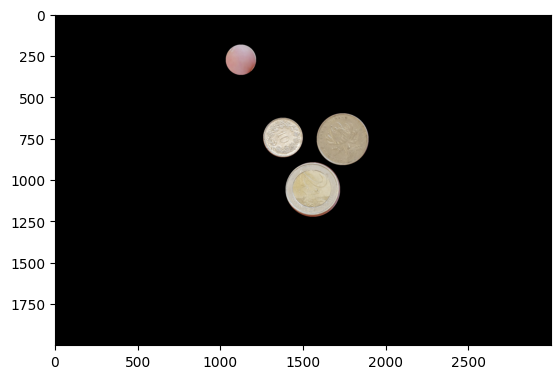

In [24]:
import random
list = random.sample(range(0,80),10)
print(list)
list = [25, 29, 31, 32, 38, 77, 78, 79]
# list=[0,1]
for i in list:
    print(i, coin_dataset.labels.iloc[i, 0])
    circles = plot_coins(img=coin_dataset[i]['image'], func=get_circles, title="Coins")
    print("circles: ", circles)

    mask = np.zeros(coin_dataset[i]['image'].shape[:2], dtype=np.uint8)
    for j in range(len(circles)):
        current_circle = circles[j]
        rr, cc = skimage.draw.disk(current_circle[0:2][::-1], current_circle[2], shape=coin_dataset[i]['image'].shape[:2])
        mask[rr, cc] = 1

    mask_3d = np.stack([mask] * 3, axis=-1)
    masked_image = mask_3d * coin_dataset[i]['image']
    plt.imshow(masked_image)

    patches = crop_image_into_patches(masked_image, circles = circles)
    for p in range(len(patches)):                                     # saving the cropped images
        cv2.imwrite(f'cropped_{i}_{p}.jpg', cv2.cvtColor(patches[p], cv2.COLOR_RGB2BGR))    
